# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

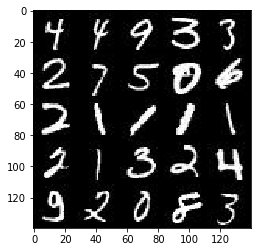

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

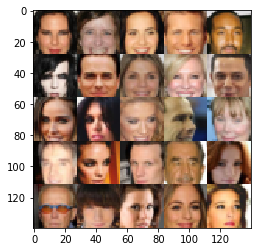

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(dtype=tf.float32,
                                shape=(None,image_width,image_height,image_channels),name='input_real')
    input_z = tf.placeholder(dtype=tf.float32,shape=(None,z_dim),name='input_z')
    learning_rate = tf.placeholder(dtype=tf.float32,name='learning_rate')
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator',reuse=reuse):
        alpha = 0.2
        initializer1 = tf.contrib.layers.xavier_initializer()
        x = tf.layers.conv2d(images,64,5,strides=(2,2),padding='same',kernel_initializer=initializer1)
        x = tf.maximum(alpha * x,x)
        #14*14*64
        
        initializer2 = tf.contrib.layers.xavier_initializer()
        x1 = tf.layers.conv2d(x,128,5,strides=(2,2),padding='same',kernel_initializer=initializer2)
        x1 = tf.layers.batch_normalization(x1,training=True)
        x1 = tf.maximum(alpha*x1,x1)       
        #7 * 7 * 128
        
        flat = tf.reshape(x1,shape=(-1,7*7*128))
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)



Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [36]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator',reuse= not is_train):
        
        x1 = tf.layers.dense(z,7*7*512)

        x1 = tf.reshape(x1,shape=(-1,7,7,512))
        
        x1 = tf.layers.batch_normalization(x1,training=is_train)
        
        x1 = tf.maximum(alpha*x1,x1)
        
        x2 = tf.layers.conv2d_transpose(x1,128,5,strides=2,padding='same')
        
        x2 = tf.layers.batch_normalization(x2,trainable=is_train)
        
        x2 = tf.maximum(alpha*x2,x2)
        
        logits = tf.layers.conv2d_transpose(x2,out_channel_dim,5,strides=2,padding='same')
        
        out = tf.tanh(logits)
        return out




"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [37]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    model_z = generator(input_z,out_channel_dim)
    smooth = 0.1
    d_model_real , d_logits_real = discriminator(input_real,reuse=False)
    d_model_fake ,d_logits_fake = discriminator(model_z,reuse=True)
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real,
            labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake,
            labels=tf.zeros_like(d_model_fake)))
    d_loss = d_loss_fake + d_loss_real
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake,
            labels=tf.ones_like(d_model_fake)))
    
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [38]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    var_list = tf.trainable_variables()
    g_var_list = [var for var in var_list if var.name.startswith('generator')]
    d_var_list = [var for var in var_list if var.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss,var_list=d_var_list)
        g_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss,var_list=g_var_list)
    
    return d_opt, g_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [39]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [40]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    input_real , input_z , input_learning_rate = model_inputs(data_shape[1],data_shape[2],data_shape[3],z_dim)
    channel_dim = 3 if data_shape[3] == 3 else 1
    d_loss,g_loss = model_loss(input_real,input_z,channel_dim)
    d_train_opt,g_train_opt = model_opt(d_loss,g_loss,learning_rate,beta1)
    

    steps = 0
    print_every = 100
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                num_images = len(batch_images)
                batch_z = np.random.uniform(-1,1,size=(num_images,z_dim))
                _ = sess.run(d_train_opt,feed_dict={input_real:batch_images
                                                    ,input_z:batch_z
                                                    ,input_learning_rate:learning_rate})
                _ = sess.run(g_train_opt,feed_dict={input_real:batch_images
                                                    ,input_z:batch_z
                                                    ,input_learning_rate:learning_rate})
                
                if steps%print_every == 0:
                    d_train_loss = sess.run(d_loss,feed_dict={input_real:batch_images,input_z:batch_z})
                    g_train_loss = sess.run(g_loss,feed_dict={input_real:batch_images,input_z:batch_z})
                    
                    print('Epoch is {}/{}'.format(epoch_i+1,epoch_count),
                         'Discriminator loss is {:.4f}'.format(d_train_loss),
                         'Generator loss is {:.4f}'.format(g_train_loss))
                    
                    show_generator_output(sess,num_images,input_z,channel_dim,data_image_mode)
                    
            d_train_loss = sess.run(d_loss,feed_dict={input_real:batch_images,input_z:batch_z})
            g_train_loss = sess.run(g_loss,feed_dict={input_real:batch_images,input_z:batch_z})

            print('Epoch is {}/{}'.format(epoch_i+1,epoch_count),
                 'Discriminator loss is {:.4f}'.format(d_train_loss),
                 'Generator loss is {:.4f}'.format(g_train_loss))

            show_generator_output(sess,num_images,input_z,channel_dim,data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch is 1/2 Discriminator loss is 0.4280 Generator loss is 2.7593


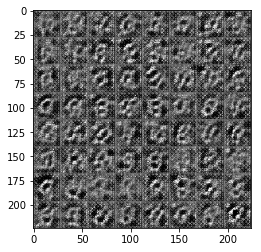

Epoch is 1/2 Discriminator loss is 1.4183 Generator loss is 0.6390


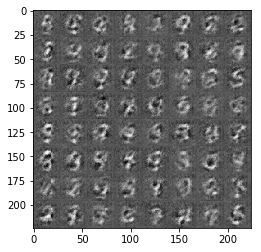

Epoch is 1/2 Discriminator loss is 1.0290 Generator loss is 0.8707


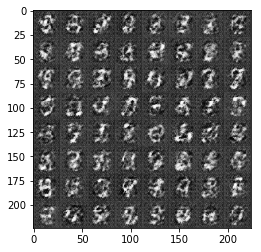

Epoch is 1/2 Discriminator loss is 0.6014 Generator loss is 1.8940


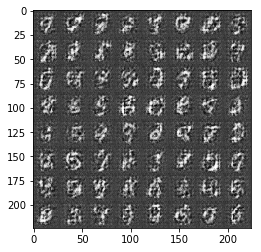

Epoch is 1/2 Discriminator loss is 1.5916 Generator loss is 0.4405


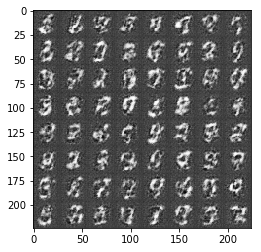

Epoch is 1/2 Discriminator loss is 0.4985 Generator loss is 2.3855


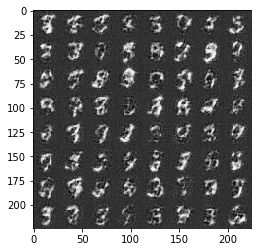

Epoch is 1/2 Discriminator loss is 0.6571 Generator loss is 1.5379


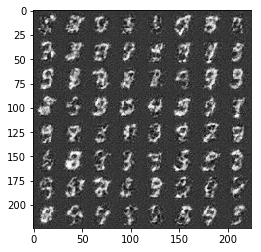

Epoch is 1/2 Discriminator loss is 0.4660 Generator loss is 2.4425


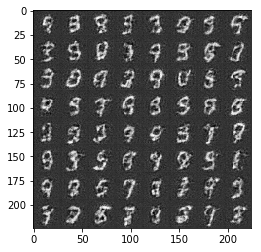

Epoch is 1/2 Discriminator loss is 0.8753 Generator loss is 1.5968


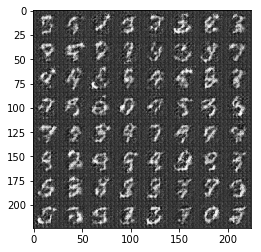

Epoch is 1/2 Discriminator loss is 0.7860 Generator loss is 1.6785


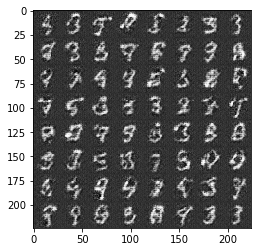

Epoch is 2/2 Discriminator loss is 0.6634 Generator loss is 1.7595


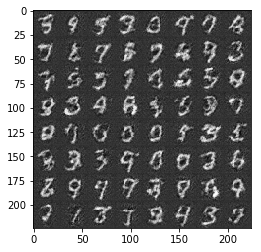

Epoch is 2/2 Discriminator loss is 0.4555 Generator loss is 3.4264


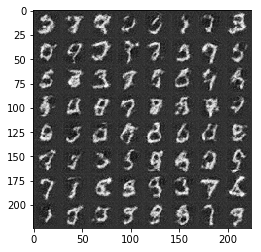

Epoch is 2/2 Discriminator loss is 0.4013 Generator loss is 3.8608


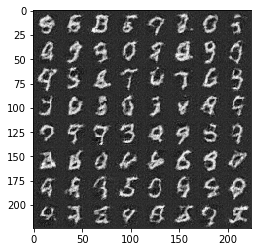

Epoch is 2/2 Discriminator loss is 0.7888 Generator loss is 1.3084


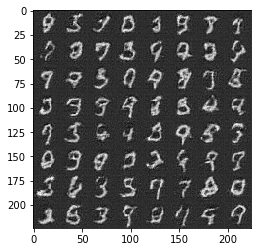

Epoch is 2/2 Discriminator loss is 0.6289 Generator loss is 1.5344


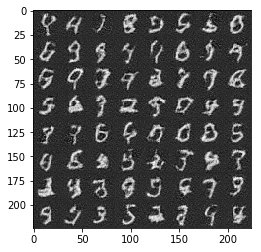

Epoch is 2/2 Discriminator loss is 0.8158 Generator loss is 1.2579


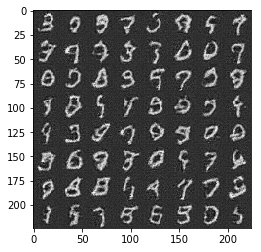

Epoch is 2/2 Discriminator loss is 0.8503 Generator loss is 1.2240


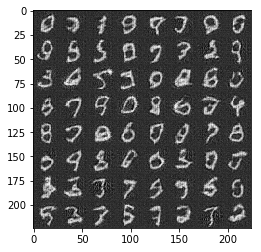

Epoch is 2/2 Discriminator loss is 0.4294 Generator loss is 3.0171


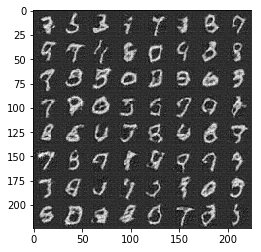

Epoch is 2/2 Discriminator loss is 0.5579 Generator loss is 2.2429


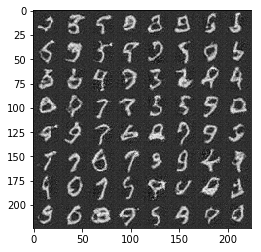

Epoch is 2/2 Discriminator loss is 2.4319 Generator loss is 4.9009


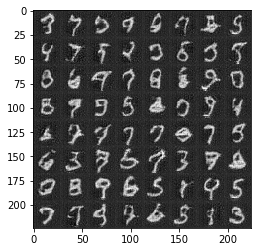

In [41]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch is 1/2 Discriminator loss is 0.3740 Generator loss is 3.7154


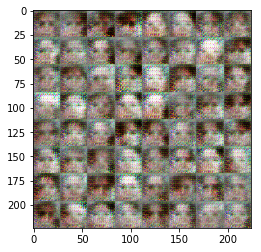

Epoch is 1/2 Discriminator loss is 2.6994 Generator loss is 11.2665


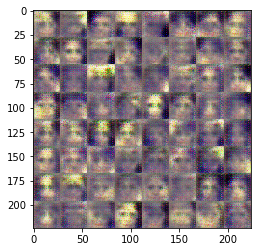

Epoch is 1/2 Discriminator loss is 1.5825 Generator loss is 0.7955


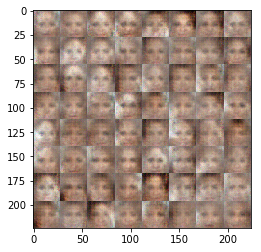

Epoch is 1/2 Discriminator loss is 1.5833 Generator loss is 0.9922


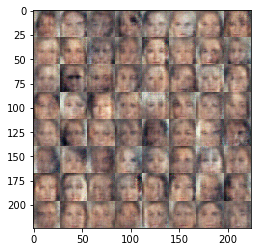

Epoch is 1/2 Discriminator loss is 1.4964 Generator loss is 0.9801


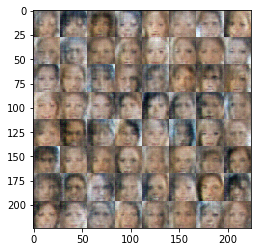

Epoch is 1/2 Discriminator loss is 1.6713 Generator loss is 0.5440


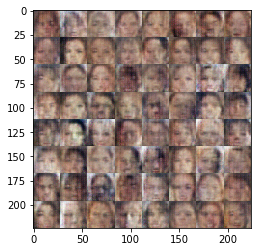

Epoch is 1/2 Discriminator loss is 1.4656 Generator loss is 0.7947


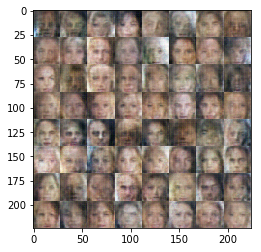

Epoch is 1/2 Discriminator loss is 1.4454 Generator loss is 0.6262


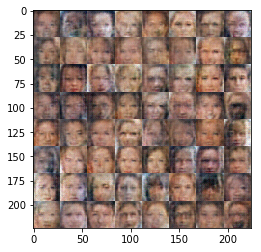

Epoch is 1/2 Discriminator loss is 1.4888 Generator loss is 0.7551


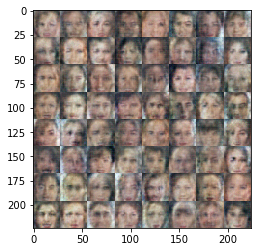

Epoch is 1/2 Discriminator loss is 1.8742 Generator loss is 0.9132


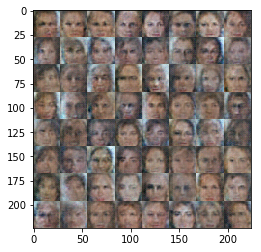

Epoch is 1/2 Discriminator loss is 1.5831 Generator loss is 0.9842


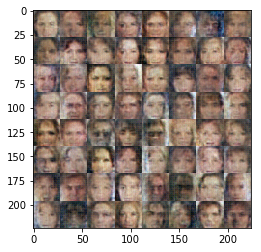

Epoch is 1/2 Discriminator loss is 1.5270 Generator loss is 0.6612


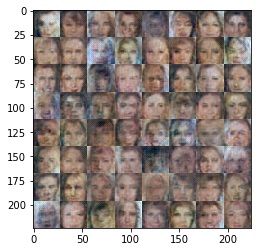

Epoch is 1/2 Discriminator loss is 1.4038 Generator loss is 0.8678


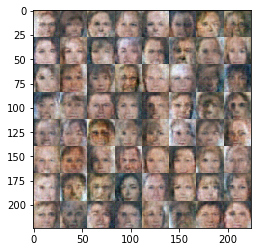

Epoch is 1/2 Discriminator loss is 1.4575 Generator loss is 0.9008


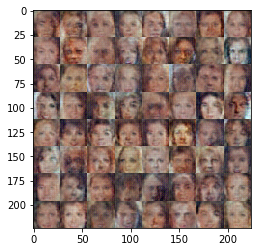

Epoch is 1/2 Discriminator loss is 1.8773 Generator loss is 0.5334


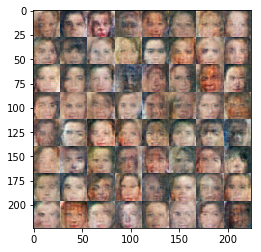

Epoch is 1/2 Discriminator loss is 1.5126 Generator loss is 0.6673


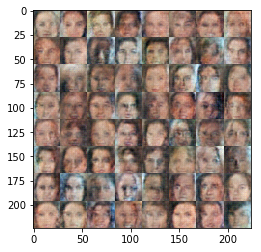

Epoch is 1/2 Discriminator loss is 1.5260 Generator loss is 0.5851


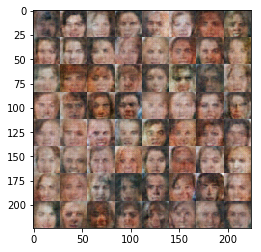

Epoch is 1/2 Discriminator loss is 1.4182 Generator loss is 0.7286


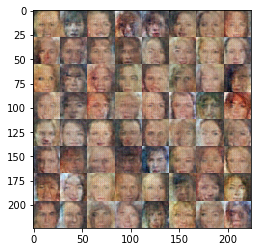

Epoch is 1/2 Discriminator loss is 1.4616 Generator loss is 0.5504


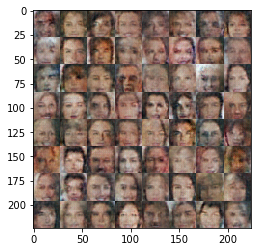

Epoch is 1/2 Discriminator loss is 1.5970 Generator loss is 0.4918


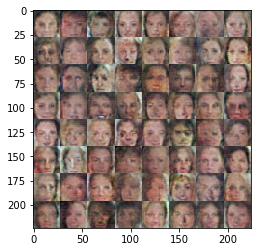

Epoch is 1/2 Discriminator loss is 1.4504 Generator loss is 0.6124


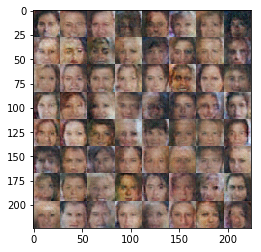

Epoch is 1/2 Discriminator loss is 1.4285 Generator loss is 0.6558


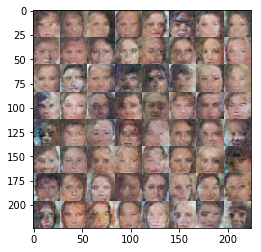

Epoch is 1/2 Discriminator loss is 1.3505 Generator loss is 0.7029


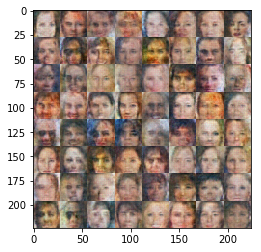

Epoch is 1/2 Discriminator loss is 1.3945 Generator loss is 0.7643


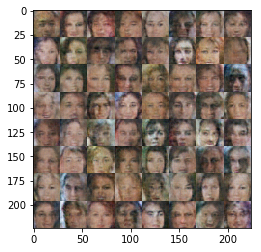

Epoch is 1/2 Discriminator loss is 1.3926 Generator loss is 0.7508


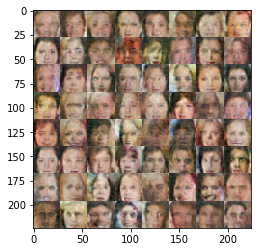

Epoch is 1/2 Discriminator loss is 1.3197 Generator loss is 0.9507


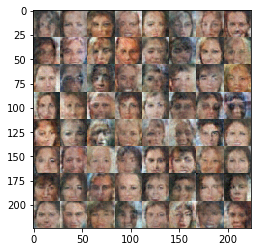

Epoch is 1/2 Discriminator loss is 1.3957 Generator loss is 0.6494


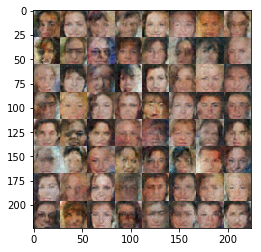

Epoch is 1/2 Discriminator loss is 1.4294 Generator loss is 0.7487


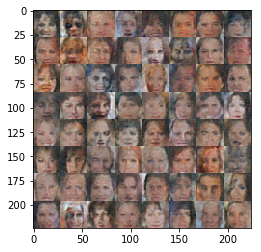

Epoch is 1/2 Discriminator loss is 1.4760 Generator loss is 1.3166


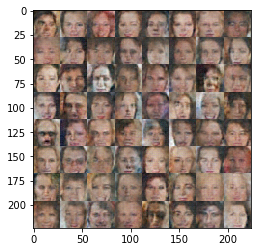

Epoch is 1/2 Discriminator loss is 1.3241 Generator loss is 0.6691


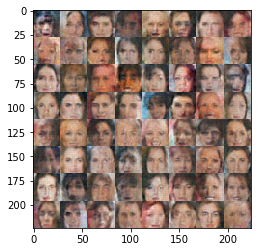

Epoch is 1/2 Discriminator loss is 1.5405 Generator loss is 0.5338


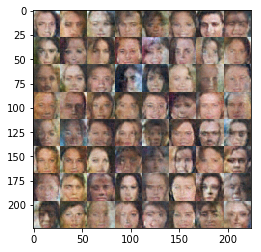

Epoch is 1/2 Discriminator loss is 1.3554 Generator loss is 0.9464


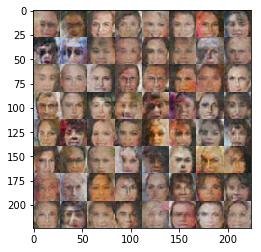

Epoch is 2/2 Discriminator loss is 1.5548 Generator loss is 0.5262


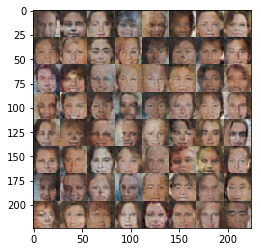

Epoch is 2/2 Discriminator loss is 1.4836 Generator loss is 1.0289


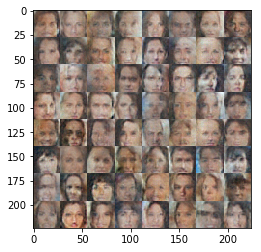

Epoch is 2/2 Discriminator loss is 1.3692 Generator loss is 0.9274


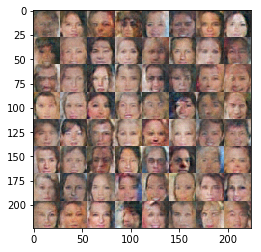

Epoch is 2/2 Discriminator loss is 1.3853 Generator loss is 0.8319


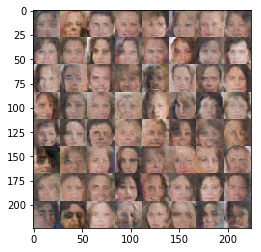

Epoch is 2/2 Discriminator loss is 1.3382 Generator loss is 0.6199


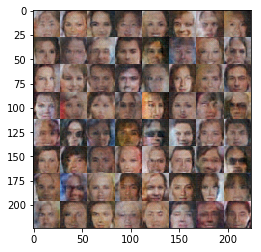

Epoch is 2/2 Discriminator loss is 1.3987 Generator loss is 0.8815


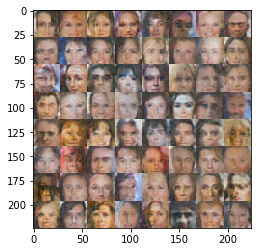

Epoch is 2/2 Discriminator loss is 1.3419 Generator loss is 0.8221


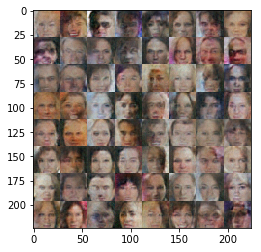

Epoch is 2/2 Discriminator loss is 1.3405 Generator loss is 0.6576


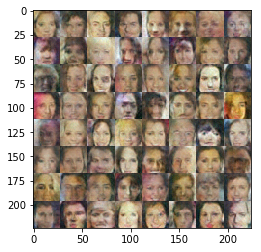

Epoch is 2/2 Discriminator loss is 1.5864 Generator loss is 1.1181


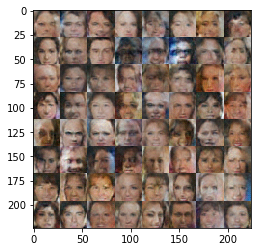

Epoch is 2/2 Discriminator loss is 1.5654 Generator loss is 1.0090


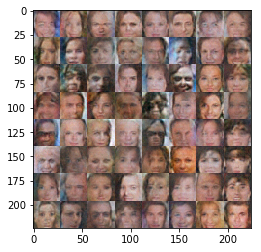

Epoch is 2/2 Discriminator loss is 1.4498 Generator loss is 0.6170


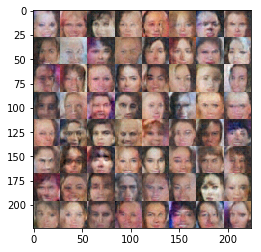

Epoch is 2/2 Discriminator loss is 1.6196 Generator loss is 0.3956


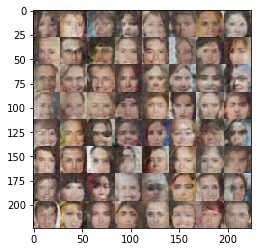

Epoch is 2/2 Discriminator loss is 1.4417 Generator loss is 1.0481


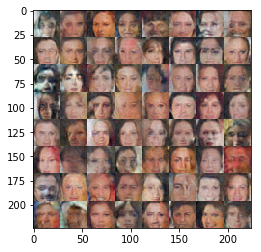

Epoch is 2/2 Discriminator loss is 2.4434 Generator loss is 1.1994


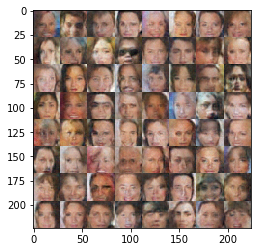

Epoch is 2/2 Discriminator loss is 1.7086 Generator loss is 0.6723


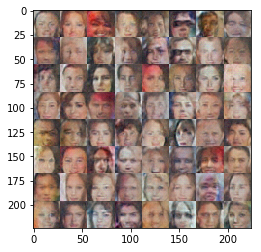

Epoch is 2/2 Discriminator loss is 1.1486 Generator loss is 1.1550


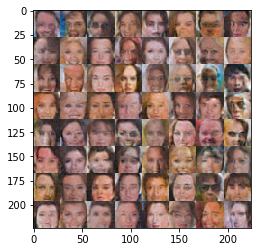

Epoch is 2/2 Discriminator loss is 1.2748 Generator loss is 0.8200


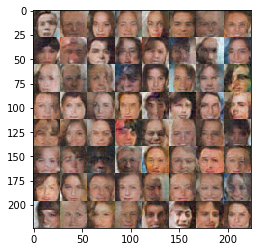

Epoch is 2/2 Discriminator loss is 1.3464 Generator loss is 0.8494


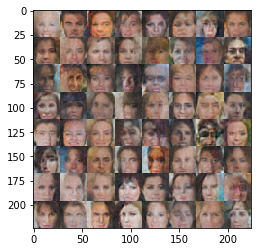

Epoch is 2/2 Discriminator loss is 1.4867 Generator loss is 0.5651


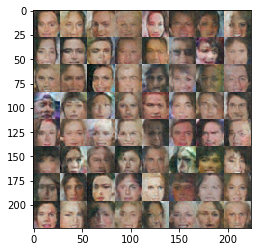

Epoch is 2/2 Discriminator loss is 1.3291 Generator loss is 0.7993


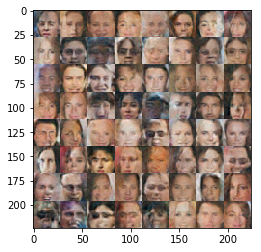

Epoch is 2/2 Discriminator loss is 1.6964 Generator loss is 1.3262


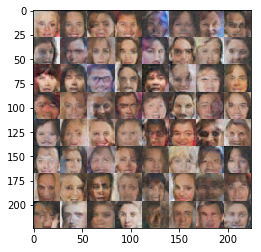

Epoch is 2/2 Discriminator loss is 1.3469 Generator loss is 0.8284


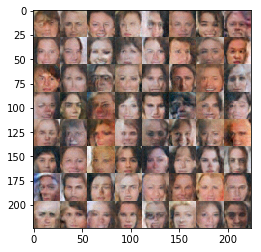

Epoch is 2/2 Discriminator loss is 1.5202 Generator loss is 0.5405


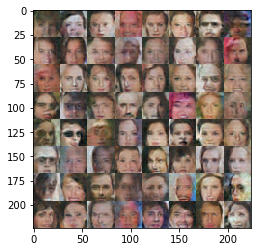

Epoch is 2/2 Discriminator loss is 1.4151 Generator loss is 0.9988


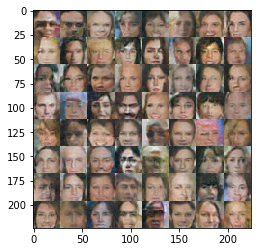

Epoch is 2/2 Discriminator loss is 1.8996 Generator loss is 0.3117


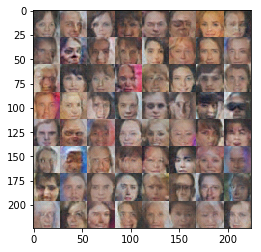

Epoch is 2/2 Discriminator loss is 1.3700 Generator loss is 0.6388


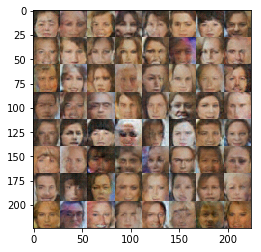

Epoch is 2/2 Discriminator loss is 1.3990 Generator loss is 1.0272


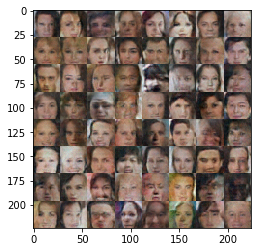

Epoch is 2/2 Discriminator loss is 1.3679 Generator loss is 0.8500


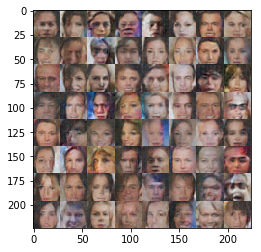

Epoch is 2/2 Discriminator loss is 1.3246 Generator loss is 0.7523


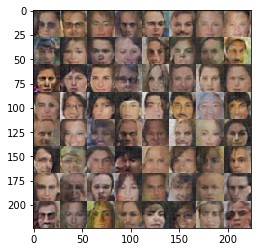

Epoch is 2/2 Discriminator loss is 1.4123 Generator loss is 0.7217


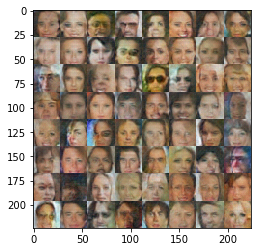

Epoch is 2/2 Discriminator loss is 1.3674 Generator loss is 0.8163


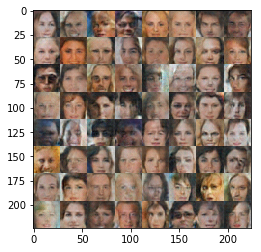

Epoch is 2/2 Discriminator loss is 1.4116 Generator loss is 0.6502


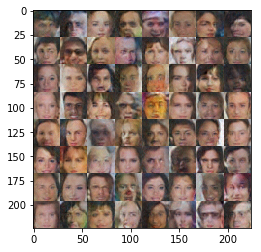

Epoch is 2/2 Discriminator loss is 1.4644 Generator loss is 0.7093


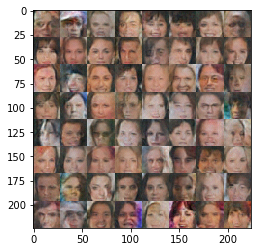

In [42]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.